# Two-Stage Object Detector Faster R-CNN
In this project I implemented a **two-stage** object detector, based on [Faster R-CNN](https://arxiv.org/pdf/1506.01497.pdf), which consists of two modules, Region Proposal Networks (RPN) and Fast R-CNN and extends previous project [YOLO detector](https://github.com/shushukurov/ML_Portfolio/tree/main/SingleStageDetector_YOLO). I use it to train a model that can detect objects on novel images and evaluate the detection accuracy using the classic metric mean Average Precision ([mAP](https://github.com/Cartucho/mAP)).

## Setup code

In [2]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import coutils
from coutils import extract_drive_file_id, register_colab_notebooks, \
                    fix_random_seed, rel_error
import matplotlib.pyplot as plt
import numpy as np
import cv2
import copy
import time
import shutil
import os

# for plotting
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# data type and device for torch.tensor
to_float = {'dtype': torch.float, 'device': 'cpu'}
to_float_cuda = {'dtype': torch.float, 'device': 'cuda'}
to_double = {'dtype': torch.double, 'device': 'cpu'}
to_double_cuda = {'dtype': torch.double, 'device': 'cuda'}
to_long = {'dtype': torch.long, 'device': 'cpu'}
to_long_cuda = {'dtype': torch.long, 'device': 'cuda'}

# for mAP evaluation
!rm -rf mAP
!git clone https://github.com/Cartucho/mAP.git

Cloning into 'mAP'...
remote: Enumerating objects: 908, done.
remote: Total 908 (delta 0), reused 0 (delta 0), pack-reused 908
Receiving objects: 100% (908/908), 14.71 MiB | 37.29 MiB/s, done.
Resolving deltas: 100% (321/321), done.


## Import functions from previous project YOLO single stage detector
In this project I re-used some pieces of code that I implemented in the previous project [YOLO single stage detector](https://github.com/shushukurov/ML_Portfolio/tree/main/SingleStageDetector_YOLO).

In [5]:
YOLO_NOTEBOOK_LINK = "https://colab.research.google.com/drive/16w_Tll3dIicYKOcOwQs2NMDvQ6toe-86"

fcn_id = extract_drive_file_id(YOLO_NOTEBOOK_LINK)
print('Google Drive file id: "%s"' % fcn_id)
register_colab_notebooks({'single_stage_detector_yolo': fcn_id})

from single_stage_detector_yolo import data_visualizer, FeatureExtractor
from single_stage_detector_yolo import get_pascal_voc2007_data, pascal_voc2007_loader
from single_stage_detector_yolo import coord_trans, GenerateGrid, GenerateAnchor, GenerateProposal
from single_stage_detector_yolo import IoU, ReferenceOnActivatedAnchors,nms
from single_stage_detector_yolo import DetectionSolver, DetectionInference

print('Import successful!')

Google Drive file id: "16w_Tll3dIicYKOcOwQs2NMDvQ6toe-86"
Cloning into 'mAP'...
remote: Enumerating objects: 908, done.
remote: Total 908 (delta 0), reused 0 (delta 0), pack-reused 908
Receiving objects: 100% (908/908), 14.71 MiB | 39.02 MiB/s, done.
Resolving deltas: 100% (321/321), done.
Import successful!


## Load PASCAL VOC 2007 data
As in the previous notebook, I used the PASCAL VOC 2007 dataset to train my object detection system.

In [6]:
train_dataset = get_pascal_voc2007_data('/content', 'train')
val_dataset = get_pascal_voc2007_data('/content', 'val')

Using downloaded and verified file: /content/VOCtrainval_06-Nov-2007.tar


In [7]:
class_to_idx = {'aeroplane':0, 'bicycle':1, 'bird':2, 'boat':3, 'bottle':4,
                'bus':5, 'car':6, 'cat':7, 'chair':8, 'cow':9, 'diningtable':10,
                'dog':11, 'horse':12, 'motorbike':13, 'person':14, 'pottedplant':15,
                'sheep':16, 'sofa':17, 'train':18, 'tvmonitor':19
}
idx_to_class = {i:c for c, i in class_to_idx.items()}

In [8]:
train_dataset = torch.utils.data.Subset(train_dataset, torch.arange(0, 2500)) # use 2500 samples for training
train_loader = pascal_voc2007_loader(train_dataset, 10)
val_loader = pascal_voc2007_loader(val_dataset, 10)

## Visualizing PASCAL VOC 2007
Sample a couple of images and GT boxes.

In [10]:
# default examples for visualization
fix_random_seed(0)
batch_size = 3
sampled_idx = torch.linspace(0, len(train_dataset)-1, steps=batch_size).long()

# get the size of each image first
h_list = []
w_list = []
img_list = [] # list of images
MAX_NUM_BBOX = 40
box_list = torch.LongTensor(batch_size, MAX_NUM_BBOX, 5).fill_(-1) # PADDED GT boxes

for idx, i in enumerate(sampled_idx):
  img, ann = train_dataset.__getitem__(i)
  img_list.append(img)

  all_bbox = ann['annotation']['object']
  if type(all_bbox) == dict:
    all_bbox = [all_bbox]
  for bbox_idx, one_bbox in enumerate(all_bbox):
    bbox = one_bbox['bndbox']
    obj_cls = one_bbox['name']
    box_list[idx][bbox_idx] = torch.LongTensor([int(bbox['xmin']), int(bbox['ymin']),
      int(bbox['xmax']), int(bbox['ymax']), class_to_idx[obj_cls]])

  # get sizes
  img = np.array(img)
  w_list.append(img.shape[1])
  h_list.append(img.shape[0])

w_list = torch.tensor(w_list, **to_float_cuda)
h_list = torch.tensor(h_list, **to_float_cuda)
box_list = torch.tensor(box_list, **to_float_cuda)
resized_box_list = coord_trans(box_list, w_list, h_list, mode='p2a')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


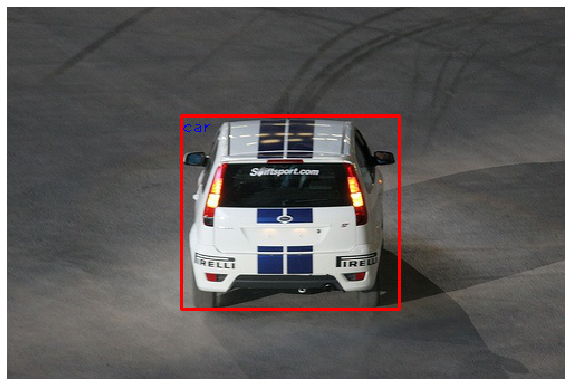

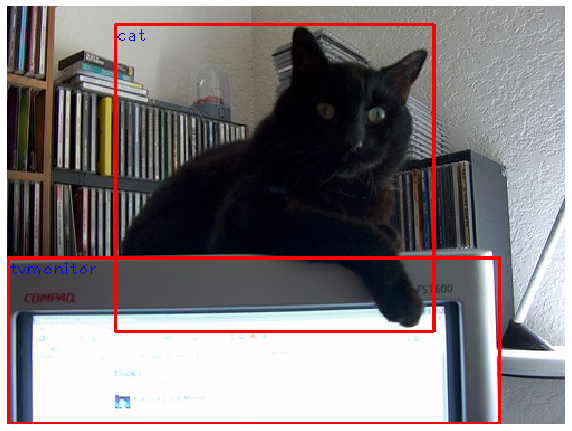

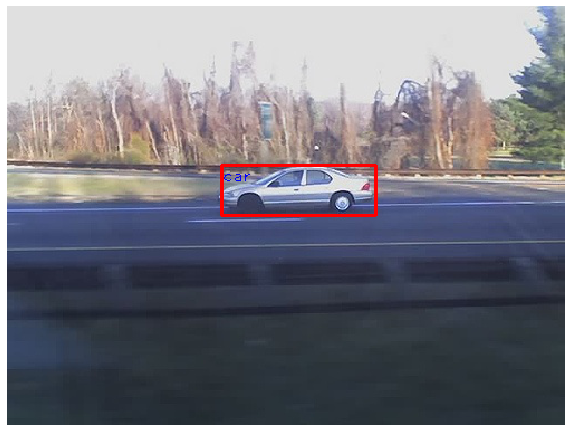

In [11]:
# visualize GT boxes
for i in range(len(img_list)):
  valid_box = sum([1 if j != -1 else 0 for j in box_list[i][:, 0]])
  data_visualizer(img_list[i], idx_to_class, box_list[i][:valid_box])

# Region Proposal Networks (RPN)
The first stage in a Faster R-CNN object detector is the *Region Proposal Network (RPN)*. The RPN classifies a set of anchors as either containing an object or not, and also regresses from the position of the anchor box to a region proposal.
The RPN is very similar to the single-stage detector I built in the previous project, except that it will not predict classification scores. I therefore reused many of the functions from the previous project in order to implement the RPN.

## Anchor
I used the exact same set of anchors as in the single-stage detector from the previous project.

In [12]:
# Hand-picked.
anchor_list = torch.tensor([[1, 1], [2, 2], [3, 3], [4, 4], [5, 5], [2, 3], [3, 2], [3, 5], [5, 3]], **to_float_cuda)
print(anchor_list.shape)

torch.Size([9, 2])


## Activated (positive) and negative anchors


********************************************************************************
Activated (positive) anchors:
1 activated anchors!


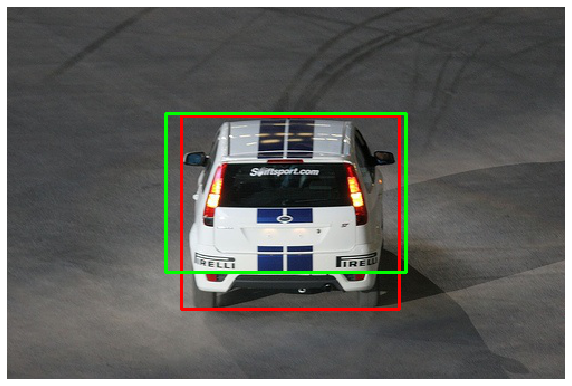

5 activated anchors!


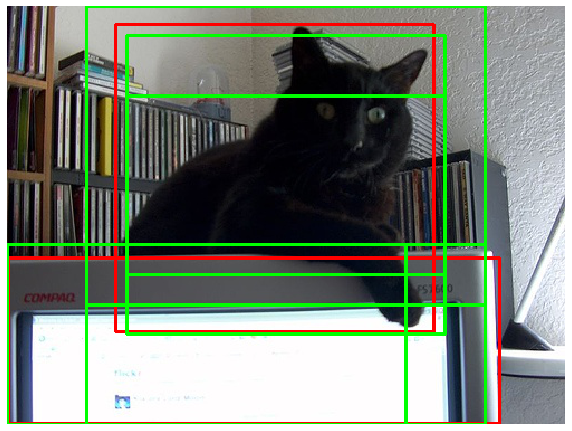

2 activated anchors!


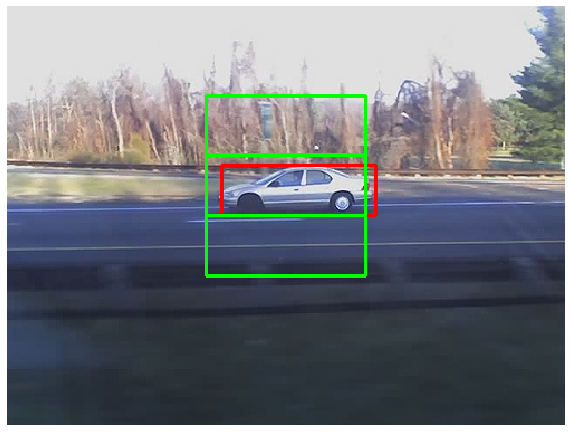

********************************************************************************
Negative anchors:
3 negative anchors!


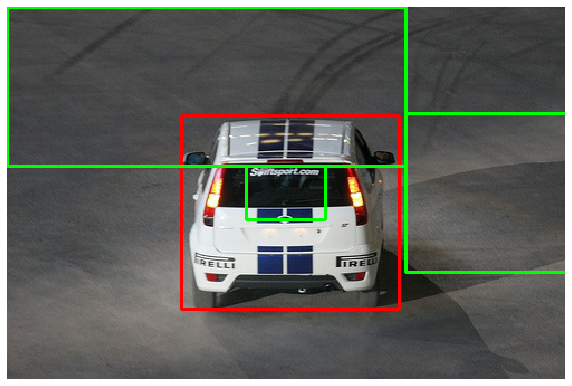

2 negative anchors!


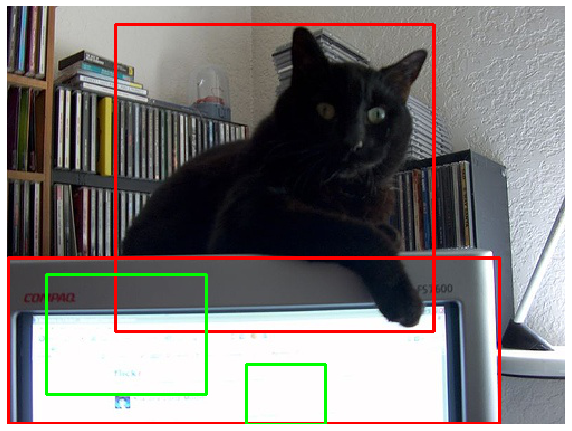

3 negative anchors!


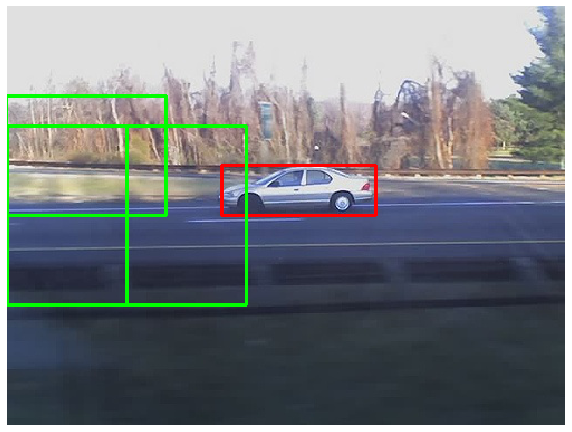

In [14]:
# visualize the activated anchors
anc_per_img = torch.prod(torch.tensor(anc_list.shape[1:-1]))

print('*'*80)
print('Activated (positive) anchors:')
for img, bbox, idx in zip(img_list, box_list, torch.arange(box_list.shape[0])):
  anc_ind_in_img = (activated_anc_ind >= idx * anc_per_img) & (activated_anc_ind < (idx+1) * anc_per_img)
  print('{} activated anchors!'.format(torch.sum(anc_ind_in_img)))
  data_visualizer(img, idx_to_class, bbox[:, :4], coord_trans(activated_anc_coord[anc_ind_in_img], w_list[idx], h_list[idx]))

print('*'*80)
print('Negative anchors:')
for img, bbox, idx in zip(img_list, box_list, torch.arange(box_list.shape[0])):
  anc_ind_in_img = (negative_anc_ind >= idx * anc_per_img) & (negative_anc_ind < (idx+1) * anc_per_img)
  print('{} negative anchors!'.format(torch.sum(anc_ind_in_img)))
  data_visualizer(img, idx_to_class, bbox[:, :4], coord_trans(negative_anc_coord[anc_ind_in_img], w_list[idx], h_list[idx]))

## Proposal module
Similar to the Prediction Networks in previous project (YOLO), but for RPN I only need to predict the object proposal scores (from the *cls* layer) and bounding box offsets (from the *reg* layer), all of which are class-agnostic.

![pred_scores2](https://miro.medium.com/max/918/1*wB3ctS9WGNmw6pP_kjLjgg.png)

Here $k$ is essentially $A$. Image credit: Ren et al, "Faster R-CNN: Towards Real-Time Object Detection with Region Proposal Networks", NeurIPS 2015, https://arxiv.org/abs/1506.01497

In [15]:
class ProposalModule(nn.Module):
  def __init__(self, in_dim, hidden_dim=256, num_anchors=9, drop_ratio=0.3):
    super().__init__()

    assert(num_anchors != 0)
    self.num_anchors = num_anchors
    self.predictHead = nn.Sequential(
          nn.Conv2d(in_dim,hidden_dim,3,padding=1),
          nn.Dropout(drop_ratio),
          nn.LeakyReLU(),
          nn.Conv2d(hidden_dim,6*self.num_anchors,1)
        )
  def _extract_anchor_data(self, anchor_data, anchor_idx):
    """
    Inputs:
    - anchor_data: Tensor of shape (B, A, D, H, W) giving a vector of length
      D for each of A anchors at each point in an H x W grid.
    - anchor_idx: int64 Tensor of shape (M,) giving anchor indices to extract
    Returns:
    - extracted_anchors: Tensor of shape (M, D) giving anchor data for each
      of the anchors specified by anchor_idx.
    """
    B, A, D, H, W = anchor_data.shape
    anchor_data = anchor_data.permute(0, 1, 3, 4, 2).contiguous().view(-1, D)
    extracted_anchors = anchor_data[anchor_idx]
    return extracted_anchors

  def forward(self, features, pos_anchor_coord=None, \
              pos_anchor_idx=None, neg_anchor_idx=None):
    """
    Inputs:
    - features: Tensor of shape (B, in_dim, H', W') giving features from the
      backbone network.
    - pos_anchor_coord: Tensor of shape (M, 4) giving the coordinates of
      positive anchors. Anchors are specified as (x_tl, y_tl, x_br, y_br) with
      the coordinates of the top-left corner (x_tl, y_tl) and bottom-right
      corner (x_br, y_br). During inference this is None.
    - pos_anchor_idx: int64 Tensor of shape (M,) giving the indices of positive
      anchors. During inference this is None.
    - neg_anchor_idx: int64 Tensor of shape (M,) giving the indicdes of negative
      anchors. During inference this is None.

    Outputs (during training):
    - conf_scores: Tensor of shape (2M, 2) giving the classification scores
      (object vs background) for each of the M positive and M negative anchors.
    - offsets: Tensor of shape (M, 4) giving predicted transforms for the
      M positive anchors.
    - proposals: Tensor of shape (M, 4) giving predicted region proposals for
      the M positive anchors.

    Outputs (during inference):
    - conf_scores: Tensor of shape (B, A, 2, H', W') giving the predicted
      classification scores (object vs background) for all anchors
    - offsets: Tensor of shape (B, A, 4, H', W') giving the predicted transforms
      for all anchors
    """
    if pos_anchor_coord is None or pos_anchor_idx is None or neg_anchor_idx is None:
      mode = 'eval'
    else:
      mode = 'train'
    anchor_features=self.predictHead(features) #Bx(Ax6)x7x7
    # split features into conf_package and offsets_package
    B,_,H,W = anchor_features.shape
    anchor_features = anchor_features.reshape(B,self.num_anchors,6,H,W)
    conf_package = anchor_features[:,:,:2,:,:]
    offsets_package = anchor_features[:,:,2:,:,:]
    if mode == 'eval':
      conf_scores, offsets = conf_package, offsets_package
    else:
      # train mode
      extracted_conf_package_pos = self._extract_anchor_data(conf_package,pos_anchor_idx)
      extracted_conf_package_neg = self._extract_anchor_data(conf_package,neg_anchor_idx)
      conf_scores = torch.cat((extracted_conf_package_pos,extracted_conf_package_neg), dim=0)[:,0:2]
      
      offsets = self._extract_anchor_data(offsets_package,pos_anchor_idx)
      M,_=pos_anchor_coord.shape

      proposals = GenerateProposal(pos_anchor_coord.reshape(1,1,1,M,4),
                                   offsets.reshape(1,1,1,M,4),
                                   'FasterRCNN').reshape(M,4)

    if mode == 'train':
      return conf_scores, offsets, proposals
    elif mode == 'eval':
      return conf_scores, offsets

## Loss Function
The confidence score regression loss is for both activated/negative anchors while the bounding box regression loss loss is for activated anchors only.

### Confidence score regression


In [17]:
def ConfScoreRegression(conf_scores, batch_size):
  """
  Binary cross-entropy loss
  Inputs:
  - conf_scores: Predicted confidence scores, of shape (2M, 2). Assume that the
    first M are positive samples, and the last M are negative samples.

  Outputs:
  - conf_score_loss: Torch scalar
  """
  # the target conf_scores for positive samples are ones and negative are zeros
  M = conf_scores.shape[0] // 2
  GT_conf_scores = torch.zeros_like(conf_scores)
  GT_conf_scores[:M, 0] = 1.
  GT_conf_scores[M:, 1] = 1.

  conf_score_loss = F.binary_cross_entropy_with_logits(conf_scores, GT_conf_scores, \
                                     reduction='sum') * 1. / batch_size
  return conf_score_loss

### Bounding box regression

In [18]:
def BboxRegression(offsets, GT_offsets, batch_size):
  """"
  Use SmoothL1 loss as in Faster R-CNN

  Inputs:
  - offsets: Predicted box offsets, of shape (M, 4)
  - GT_offsets: GT box offsets, of shape (M, 4)
  
  Outputs:
  - bbox_reg_loss: Torch scalar
  """
  bbox_reg_loss = F.smooth_l1_loss(offsets, GT_offsets, reduction='sum') * 1. / batch_size
  return bbox_reg_loss

## RPN module
Implementation of Region Proposal Network. It resembles the `SingleStageDetector` module from Previous project, but without the class prediction.

In [20]:
class RPN(nn.Module):
  def __init__(self):
    super().__init__()
    self.anchor_list = torch.tensor([[1, 1], [2, 2], [3, 3], [4, 4], [5, 5], [2, 3], [3, 2], [3, 5], [5, 3]])
    self.feat_extractor = FeatureExtractor()
    self.prop_module = ProposalModule(1280, num_anchors=self.anchor_list.shape[0])

  def forward(self, images, bboxes, output_mode='loss'):
    """
    Training-time forward pass for the Region Proposal Network.

    Inputs:
    - images: Tensor of shape (B, 3, 224, 224) giving input images
    - bboxes: Tensor of ground-truth bounding boxes, returned from the DataLoader
    - output_mode: One of 'loss' or 'all' that determines what is returned:

    """
    # weights to multiply to each loss term
    w_conf = 1 # for conf_scores
    w_reg = 5 # for offsets

    assert output_mode in ('loss', 'all'), 'invalid output mode!'
    features = self.feat_extractor(images)

    # Grid and anchor generation
    batch_size = images.shape[0]
    grid = GenerateGrid(batch_size)
    anchors = GenerateAnchor(self.anchor_list.to(grid.device, grid.dtype), grid)

    # Compute IoU between anchors and GT boxes
    iou_mat = IoU(anchors, bboxes)
    # determine activated & negative anchors, and GT_offsets, GT_class
    pos_anchor_idx, negative_anc_ind, _, GT_offsets, GT_class, activated_anc_coord,_ = \
      ReferenceOnActivatedAnchors(anchors, bboxes, grid, iou_mat,method='FasterRCNN')

    # Compute conf_scores, offsets, proposals through the prediction network
    conf_scores, offsets, proposals = self.prop_module(features,activated_anc_coord, 
                                                       pos_anchor_idx, negative_anc_ind)
    anc_per_img = torch.prod(torch.tensor(anchors.shape[1:-1]))

    # Compute total loss
    conf_loss = ConfScoreRegression(conf_scores, features.shape[0]) # conf_loss
    reg_loss = BboxRegression(offsets, GT_offsets, features.shape[0]) # reg_loss
    total_loss = w_conf * conf_loss + w_reg * reg_loss

    if output_mode == 'loss':
      return total_loss
    else:
      return total_loss, conf_scores, proposals, features, GT_class, pos_anchor_idx, anc_per_img


  def inference(self, images, thresh=0.5, nms_thresh=0.7, mode='RPN'):
    """
    Inference-time forward pass for the Region Proposal Network.

    Inputs:
    - images: Tensor of shape (B, 3, H, W) giving input images
    - thresh: Threshold value on confidence scores.
    - nms_thresh: IoU threshold for non-maximum suppression
    - mode: One of 'RPN' or 'FasterRCNN' to determine the outputs.

    Outputs:
    - final_proposals: List of length B, where final_proposals[i] is a Tensor
      of shape (P_i, 4) giving the coordinates of the predicted region proposals
      for the input image images[i].
    - final_conf_probs: List of length B, where final_conf_probs[i] is a
      Tensor of shape (P_i,) giving the predicted object probabilities for each
      predicted region proposal for images[i].
    - features: Tensor of shape (B, D, H', W') giving the image features
      predicted by the backbone network for each element of images.
      If mode is "RPN" then this is a dummy list of zeros instead.
    """
    assert mode in ('RPN', 'FasterRCNN'), 'invalid inference mode!'

    final_conf_probs, final_proposals = [],[]
    #Image feature extraction
    features = self.feat_extractor(images)

    # Grid and anchor generation
    batch_size = images.shape[0]
    grid = GenerateGrid(batch_size)
    anchors = GenerateAnchor(self.anchor_list.to(grid.device, grid.dtype), grid)

    # Compute conf_scores, proposals, class_prob through the prediction network
    conf_scores, offsets = self.prop_module(features) 
    #offsets: (B, A, 4, H', W')
    #conf_scores: (B, A, 2, H', W')
    B,A,_,H,W = conf_scores.shape
    
    offsets = offsets.permute((0,1,3,4,2))
    proposals = GenerateProposal(anchors, offsets, method='FasterRCNN') #proposals:B,A,H,W,4
    # transform
    conf_scores = torch.sigmoid(conf_scores[:,:,0,:,:]) 
    conf_scores = conf_scores.permute((0,2,3,1)).reshape(batch_size,-1)
    proposals = proposals.permute((0,2,3,1,4)).reshape(batch_size,-1,4)

    for i in range(batch_size):
      # get proposals, confidence scores for i-th image
      sub_conf_scores = conf_scores[i]
      sub_proposals = proposals[i]
      
      # filter by conf_scores
      mask1 = sub_conf_scores > thresh
      sub_conf_scores = sub_conf_scores[mask1]
      sub_proposals = sub_proposals[mask1,:]

      # filter by nms
      mask2 = nms(sub_proposals, sub_conf_scores, iou_threshold=nms_thresh)
      # append result
      final_proposals.append(sub_proposals[mask2,:])
      final_conf_probs.append(sub_conf_scores[mask2].unsqueeze(1))

    if mode == 'RPN':
      features = [torch.zeros_like(i) for i in final_conf_probs] # dummy class
    return final_proposals, final_conf_probs, features

## RPN solver
In Faster R-CNN, the RPN is trained jointly with the second-stage network. However, to test my RPN implementation, I first trained just the RPN; this is basically a class-agnostic single-stage detector, that only classifies regions as object or background.

In [21]:
RPNSolver = DetectionSolver # the same solver as in YOLO

## RPN - Overfitting small data

lr:  0.001


Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth



number of pos proposals:  50
(Iter 0 / 1)
(Epoch 0 / 200) loss: 30.6331 time per epoch: 0.2s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 1 / 200) loss: 75.8577 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 2 / 200) loss: 22.9270 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 3 / 200) loss: 19.1747 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 4 / 200) loss: 18.2603 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 5 / 200) loss: 17.2976 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 6 / 200) loss: 16.5154 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 7 / 200) loss: 16.0295 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 8 / 200) loss: 15.5792 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 9 / 200) loss: 14.7299 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 10 / 200) loss: 14.4

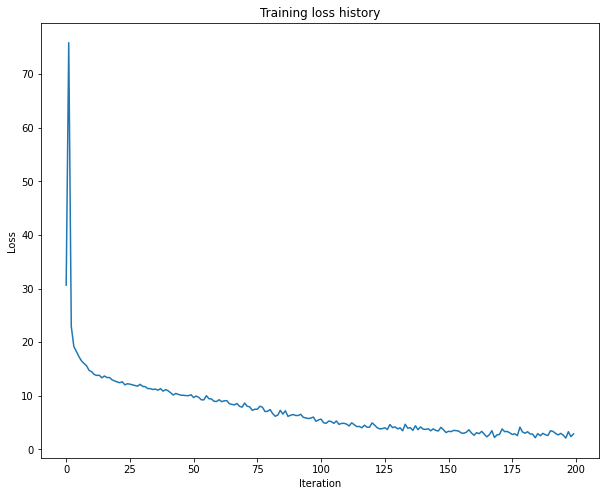

In [22]:
# monitor the training loss
num_sample = 10
small_dataset = torch.utils.data.Subset(train_dataset, torch.linspace(0, len(train_dataset)-1, steps=num_sample).long())
small_train_loader = pascal_voc2007_loader(small_dataset, 10) # a new loader

for lr in [1e-3]:
  print('lr: ', lr)
  rpn = RPN()
  RPNSolver(rpn, small_train_loader, learning_rate=lr, num_epochs=200)

## RPN - Inference
Now i need to visualize the predicted boxes from the RPN that I overfitted to a small training sample.

In [31]:
RPNInference = DetectionInference

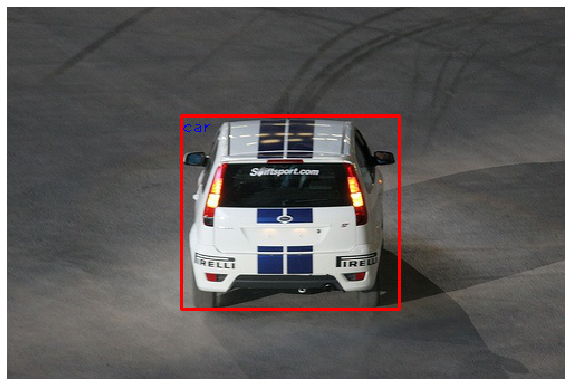

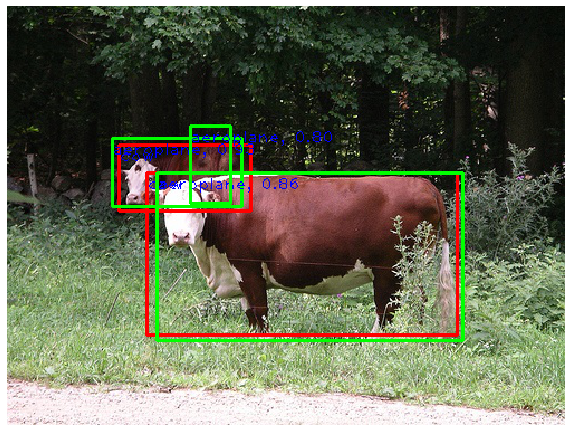

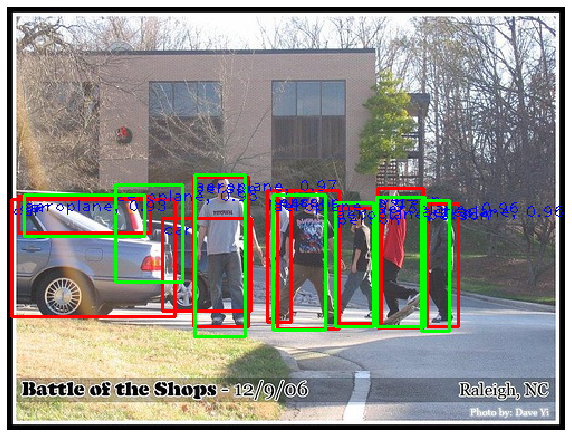

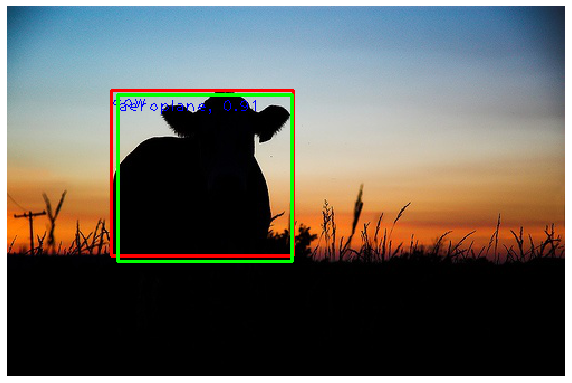

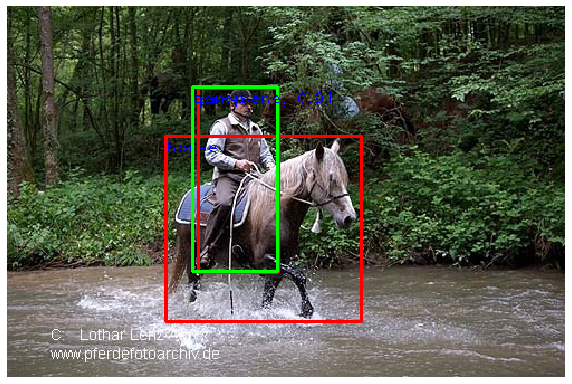

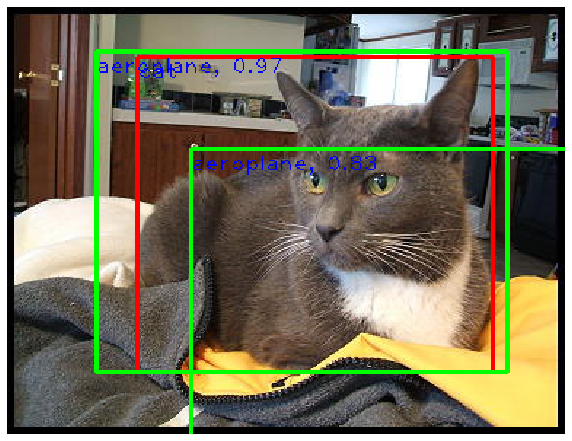

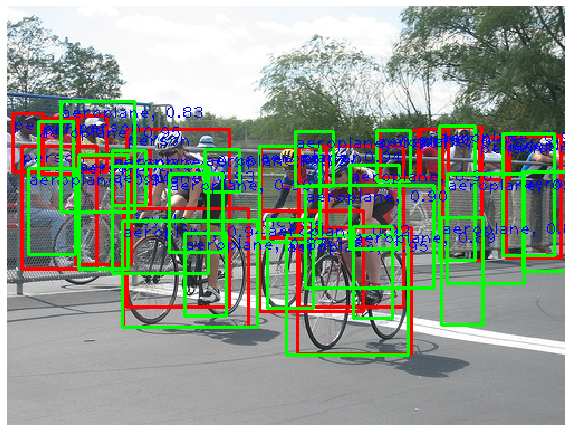

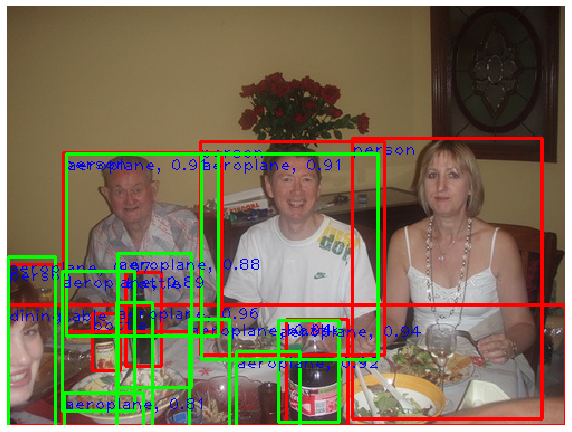

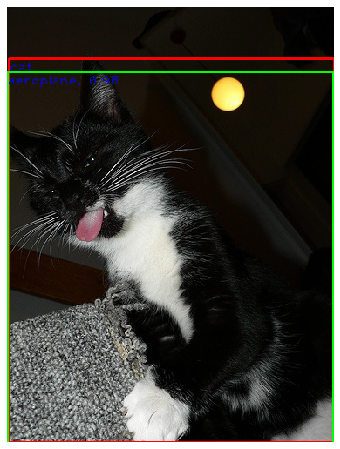

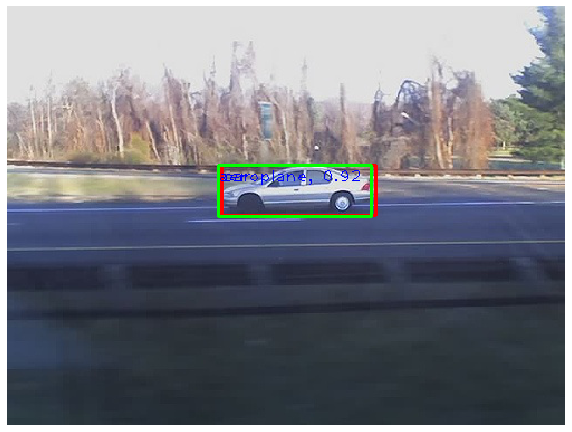

Total inference time: 2.1s


In [32]:
# visualize the output from the overfitted model on small dataset
with torch.no_grad():
    RPNInference(rpn, small_train_loader, small_dataset, idx_to_class, thresh=0.8, nms_thresh=0.3)

# Faster R-CNN
I have implemented the first half of Faster R-CNN, i.e., RPN, which is class-agnostic. So, the second half is left, which is:

Given the proposals or region of interests (RoI) from RPN, It wraps each region from CNN activation map to a fixed size 2x2 by using [RoI Align](https://arxiv.org/pdf/1703.06870.pdf). Essentially, the RoI feature is determined by bilinear interpolation over the CNN activation map.

Finally, It classifies the meanpooled RoI feature into class probabilities.


## RoI Align
I used the `roi_align` function from `torchvision`.

## Faster R-CNN

In [33]:
class TwoStageDetector(nn.Module):
  def __init__(self, in_dim=1280, hidden_dim=256, num_classes=20, \
               roi_output_w=2, roi_output_h=2, drop_ratio=0.3):
    super().__init__()

    assert(num_classes != 0)
    self.num_classes = num_classes
    self.roi_output_w, self.roi_output_h = roi_output_w, roi_output_h
    self.rpn = RPN()
    self.classifier = nn.Sequential(
        nn.Linear(in_dim, hidden_dim),
        nn.Dropout(p=drop_ratio),
        nn.ReLU(),
        nn.Linear(hidden_dim, num_classes)
    )

  def forward(self, images, bboxes):
    """
    Inputs:
    - images: Tensor of shape (B, 3, H, W) giving input images
    - bboxes: Tensor of shape (B, N, 5) giving ground-truth bounding boxes
      and category labels, from the dataloader.

    Outputs:
    - total_loss: Torch scalar giving the overall training loss.
    """
    rpn_loss, conf_scores, proposals, features, GT_class, pos_anchor_idx, anc_per_img = \
      self.rpn(images, bboxes, output_mode='all')
    # input -> features, B, N , H, W
    # boxes -> proposals, (M, 4)
    # before feeding proposals to roi_align, need to convert to (M, 5)
    M, _ = proposals.shape
    boxes = torch.zeros((M, 5), device=proposals.device, dtype=proposals.dtype)
    boxes[:, 0] = (pos_anchor_idx // anc_per_img) #.clone()
    boxes[:, 1:5] = proposals #.clone()

    roi_out = torchvision.ops.roi_align(features, boxes, (self.roi_output_w, self.roi_output_h))
    # M, 1280, h, w
    roi_pooled = torch.mean(roi_out, dim=(2,3)) #  M, 1280
    assert roi_pooled.shape == torch.Size([M, 1280]), 'shape mismatch!'

    class_prob = self.classifier(roi_pooled)
    cls_loss = F.cross_entropy(class_prob, GT_class, reduction='sum') * 1. / images.shape[0]
    total_loss = cls_loss + rpn_loss
    return total_loss

  def inference(self, images, thresh=0.5, nms_thresh=0.7):
    """"
    Inference-time forward pass for our two-stage Faster R-CNN detector
    Inputs:
    - images: Tensor of shape (B, 3, H, W) giving input images
    - thresh: Threshold value on NMS object probabilities
    - nms_thresh: IoU threshold for NMS in the RPN
    Outputs:
    - final_proposals: List of length (B,) where final_proposals[i] is a Tensor
      of shape (P_i, 4) giving the coordinates of the final predicted boxes for
      the input images[i]
    - final_conf_probs: List of length (B,) where final_conf_probs[i] is a
      Tensor of shape (P_i,) giving the predicted probabilites that the boxes
      in final_proposals[i] are objects (vs background)
    - final_class: List of length (B,), where final_class[i] is an int64 Tensor
      of shape (P_i,) giving the predicted category labels for each box in
      final_proposals[i].
    """
    with torch.no_grad():
        final_proposals, final_conf_probs, features = self.rpn.inference(images, thresh=thresh, nms_thresh=nms_thresh, mode='FasterRCNN')
        # then, get the final class
        B, _, H, W = features.shape
        # input -> features, B, 1280 , H, W
        # boxes -> final_proposals, list of B * (Pi, 4)
        roi_out = torchvision.ops.roi_align(features, final_proposals, (self.roi_output_w, self.roi_output_h))
        # N, 1280, h, w ?
        roi_pooled = torch.mean(roi_out, dim=(2,3)) #  N 1280
        # assert roi_pooled.shape == torch.Size([B, 1280]), 'shape mismatch!'
        class_prob = self.classifier(roi_pooled)
        # N, C
        pred = torch.argmax(class_prob, dim=1, keepdim=True) # shape(N, 1)
        # convert to a list
        # print(pred)
        # final_class = []

        list_of_num = []
        for pro_per_img in final_proposals:
            number = pro_per_img.shape[0]
            list_of_num.append(number)
        final_class = torch.split(pred, list_of_num, dim=0)
    return final_proposals, final_conf_probs, final_class

## Overfitting small data

number of pos proposals:  50
(Iter 0 / 1)
(Epoch 0 / 200) loss: 41.1853 time per epoch: 0.2s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 1 / 200) loss: 66.0684 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 2 / 200) loss: 41.1309 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 3 / 200) loss: 35.2969 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 4 / 200) loss: 32.5496 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 5 / 200) loss: 30.6962 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 6 / 200) loss: 29.4127 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 7 / 200) loss: 28.8139 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 8 / 200) loss: 27.8918 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 9 / 200) loss: 26.2787 time per epoch: 0.1s
number of pos proposals:  50
(Iter 0 / 1)
(Epoch 10 / 200) loss: 25.91

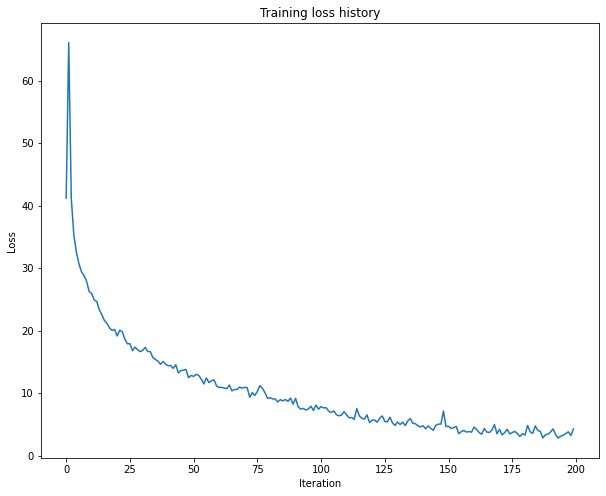

In [34]:
# monitor the training loss

lr = 1e-3
detector = TwoStageDetector()
DetectionSolver(detector, small_train_loader, learning_rate=lr, num_epochs=200)

### Inference

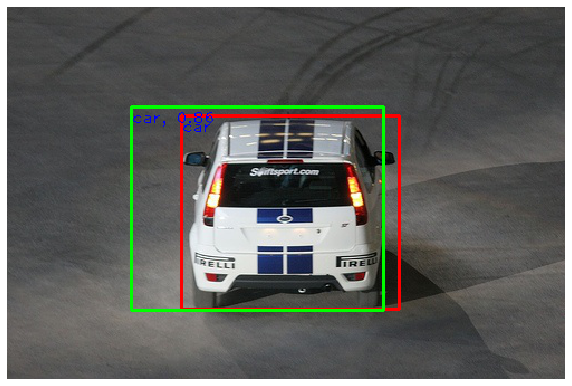

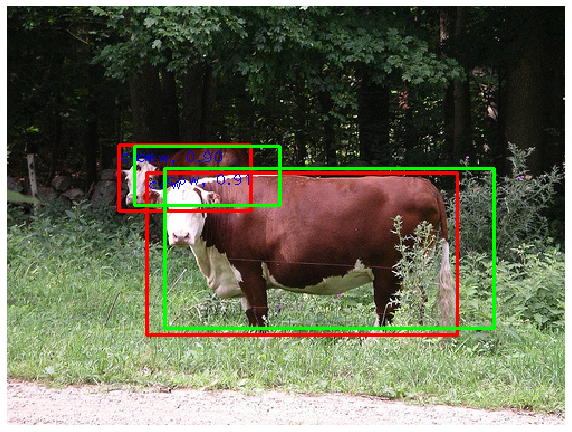

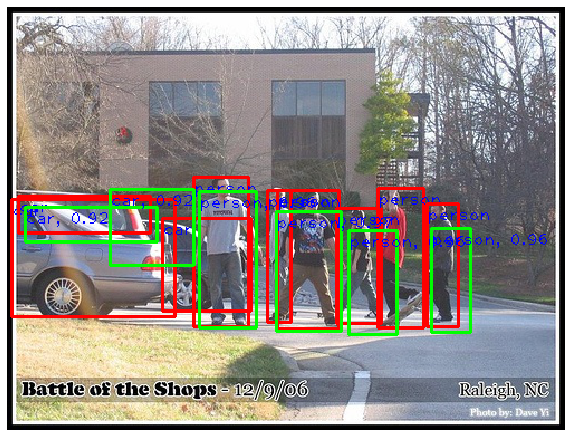

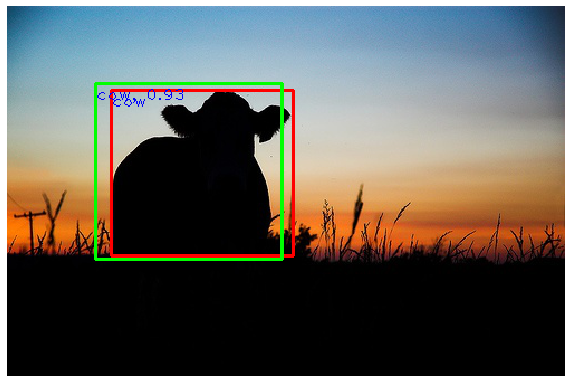

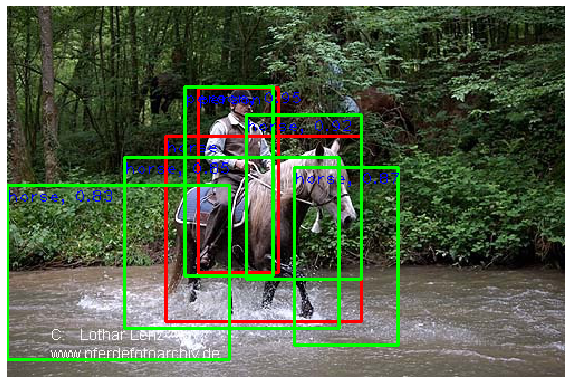

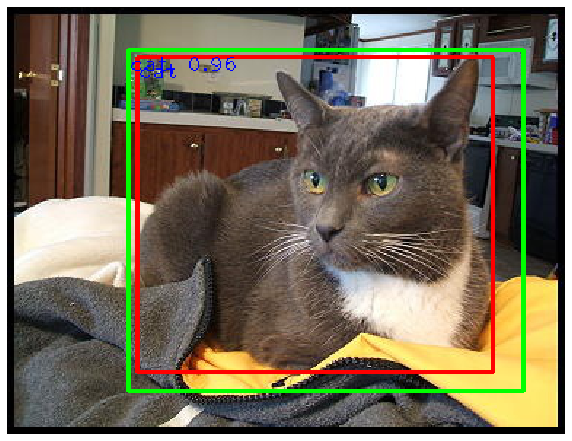

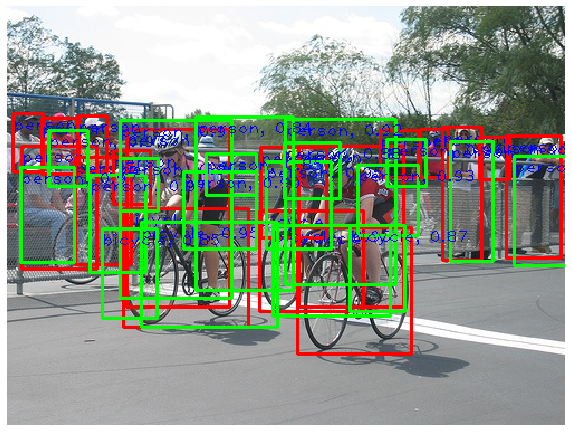

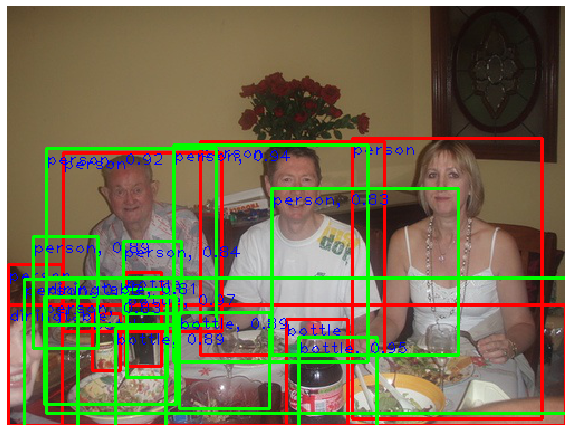

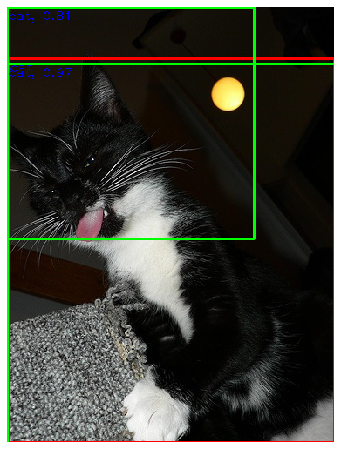

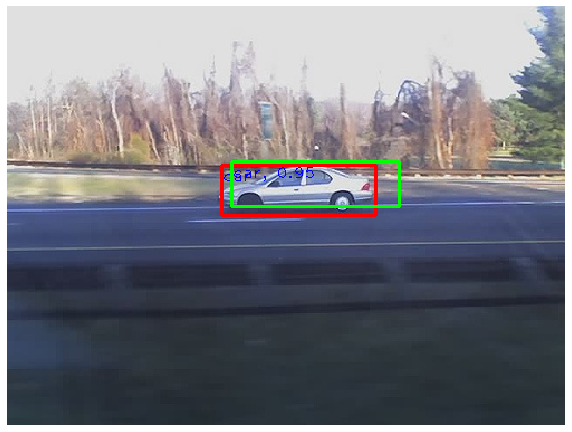

Total inference time: 2.1s


In [35]:
# visualize the output from the overfitted model on small dataset
DetectionInference(detector, small_train_loader, small_dataset, idx_to_class, thresh=0.8, nms_thresh=0.3)

## Last step
Now I trained the full Faster R-CNN model on a larger subset of the the training data. I trained for 50 epochs; this took about 40 minutes on google collab

I could train the model longer (e.g., 100 epochs), And get a better mAP but there is no point for that as a purpose of this portfolio project. 

number of pos proposals:  348
(Iter 0 / 25)
number of pos proposals:  410
(Iter 1 / 25)
number of pos proposals:  375
(Iter 2 / 25)
number of pos proposals:  362
(Iter 3 / 25)
number of pos proposals:  348
(Iter 4 / 25)
number of pos proposals:  316
(Iter 5 / 25)
number of pos proposals:  379
(Iter 6 / 25)
number of pos proposals:  362
(Iter 7 / 25)
number of pos proposals:  368
(Iter 8 / 25)
number of pos proposals:  363
(Iter 9 / 25)
number of pos proposals:  325
(Iter 10 / 25)
number of pos proposals:  355
(Iter 11 / 25)
number of pos proposals:  346
(Iter 12 / 25)
number of pos proposals:  363
(Iter 13 / 25)
number of pos proposals:  357
(Iter 14 / 25)
number of pos proposals:  349
(Iter 15 / 25)
number of pos proposals:  370
(Iter 16 / 25)
number of pos proposals:  367
(Iter 17 / 25)
number of pos proposals:  395
(Iter 18 / 25)
number of pos proposals:  386
(Iter 19 / 25)
number of pos proposals:  392
(Iter 20 / 25)
number of pos proposals:  405
(Iter 21 / 25)
number of pos propos

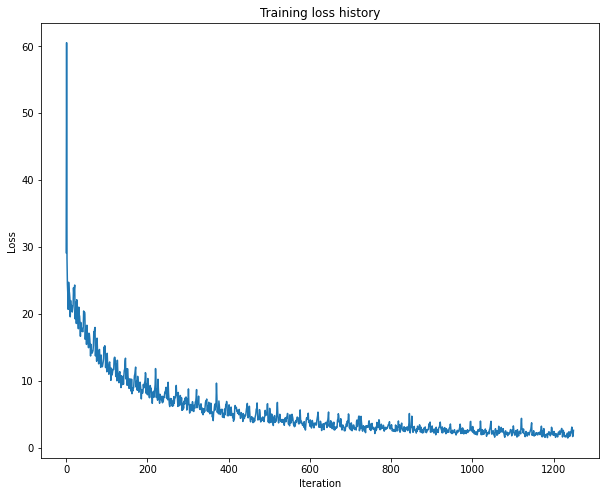

In [36]:
# monitor the training loss
train_loader = pascal_voc2007_loader(train_dataset, 100) # a new loader

num_epochs = 50
lr = 5e-3
frcnn_detector = TwoStageDetector()
DetectionSolver(frcnn_detector, train_loader, learning_rate=lr, num_epochs=num_epochs)

In [38]:
torch.save(frcnn_detector.state_dict(), 'frcnn_detector.pt') 
torch.save(frcnn_detector, 'frcnn_detector.pkl')
frcnn_detector.load_state_dict(torch.load('frcnn_detector.pt')) 

<All keys matched successfully>

### Inference

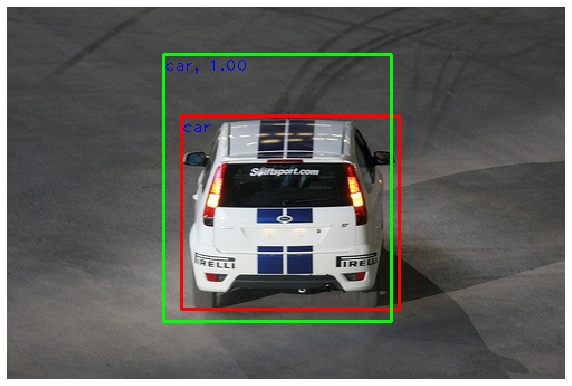

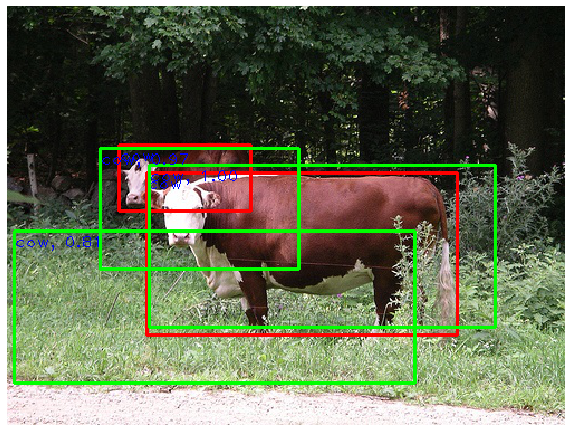

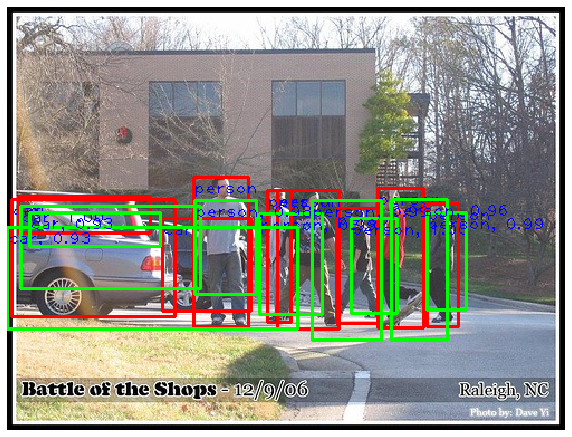

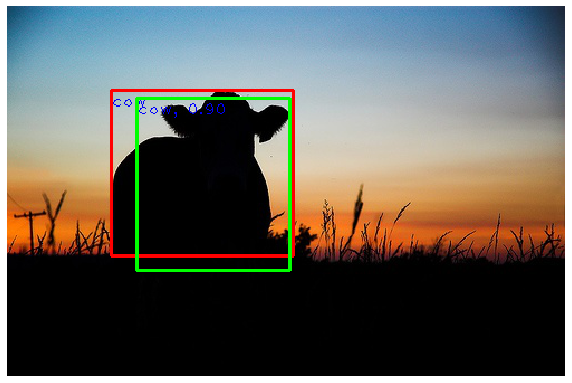

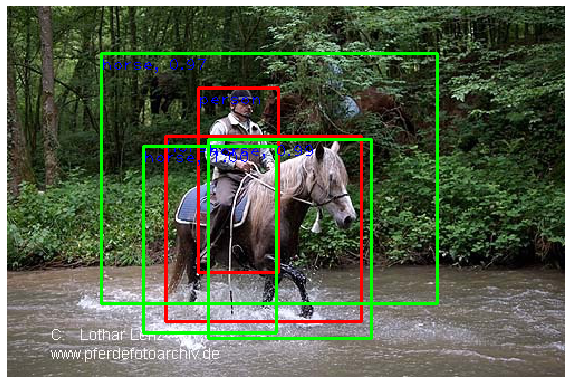

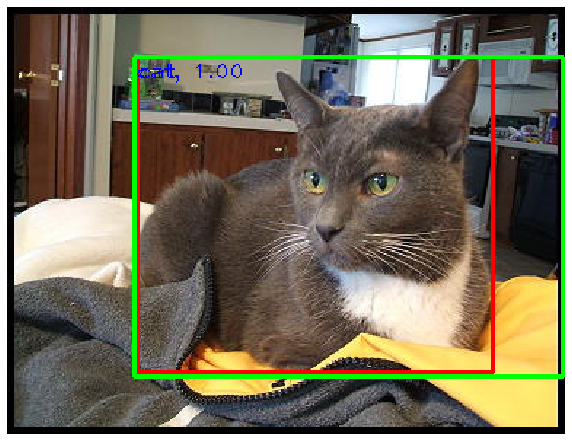

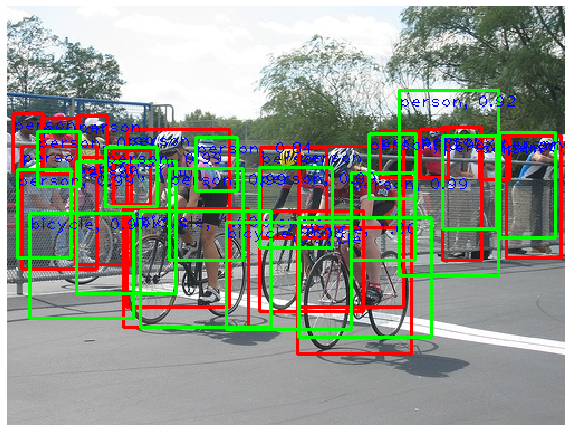

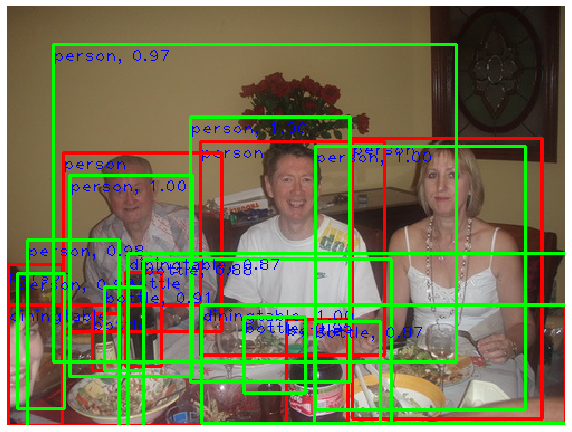

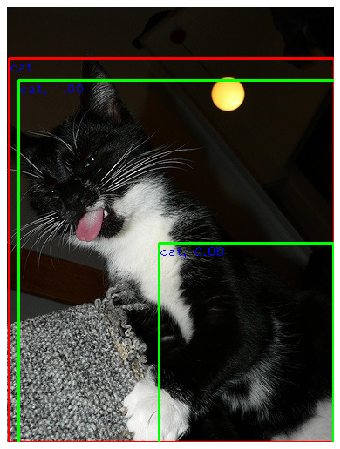

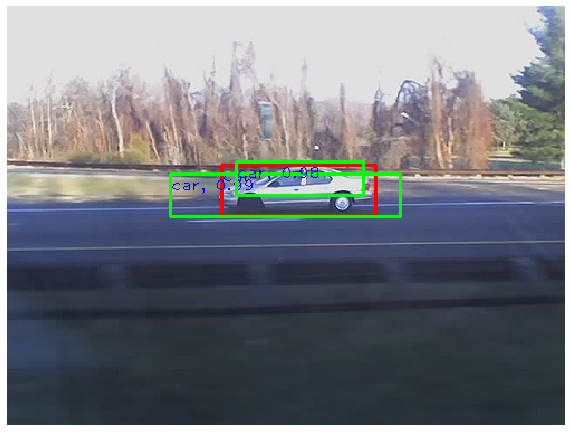

Total inference time: 2.0s


In [39]:
# visualize the same output from the model trained on the entire training set
DetectionInference(frcnn_detector, small_train_loader, small_dataset, idx_to_class)

## Evaluation
Computing mean Average Precision (mAP).

In [40]:
!rm -r mAP/input/*
DetectionInference(frcnn_detector, val_loader, val_dataset, idx_to_class, output_dir='mAP/input', thresh=0.8, nms_thresh=0.3)
# DetectionInference(frcnn_detector, train_loader, train_dataset, idx_to_class, output_dir='mAP/input', thresh=0.8, nms_thresh=0.3) 
!cd mAP && python main.py

rm: cannot remove 'mAP/input/*': No such file or directory
000005.jpg: 5 GT bboxes and 5 proposals
000007.jpg: 1 GT bboxes and 2 proposals
000009.jpg: 4 GT bboxes and 8 proposals
000016.jpg: 1 GT bboxes and 2 proposals
000019.jpg: 2 GT bboxes and 4 proposals
000020.jpg: 1 GT bboxes and 2 proposals
000021.jpg: 4 GT bboxes and 4 proposals
000024.jpg: 1 GT bboxes and 1 proposals
000030.jpg: 3 GT bboxes and 8 proposals
000039.jpg: 1 GT bboxes and 1 proposals
000041.jpg: 3 GT bboxes and 6 proposals
000046.jpg: 1 GT bboxes and 2 proposals
000050.jpg: 10 GT bboxes and 16 proposals
000051.jpg: 3 GT bboxes and 2 proposals
000052.jpg: 6 GT bboxes and 0 proposals
000060.jpg: 5 GT bboxes and 1 proposals
000063.jpg: 2 GT bboxes and 2 proposals
000065.jpg: 1 GT bboxes and 1 proposals
000072.jpg: 2 GT bboxes and 5 proposals
000081.jpg: 9 GT bboxes and 10 proposals
000093.jpg: 2 GT bboxes and 2 proposals
000095.jpg: 2 GT bboxes and 2 proposals
000099.jpg: 1 GT bboxes and 0 proposals
000101.jpg: 2 GT b